# <font color = "Green"> This notebook is a comprehensive program used for data preprocesssing and build models for Predicting EV Buying Intention

# <font color= "Indigo">Project Team:
<ol>
  <font color= "Indigo"><li>Gayathri Shanmugam</li>
  <li>Kayalvizhi Vellaichamy</li>
  <li>Nitya Malladi</li>
    <li>Saranya Anandan</li>
</ol>

### Context
The global auto manufacturing industry is undergoing rapid transformation by shifting focus from fuel-based vehicles to zero-emission vehicles (ZEVs). ZEVs are further categorized into battery electric vehicles and hydrogen fuel cell electric vehicles. In the United States, the federal government has mandated that at least 50% of the total cars sold should belong to the zero-emission category by the year 2030.
The scope of this project is to build a predictive model which classifies EV buyers in the United States based on their socio-demographic characteristics and their views on the current EV ecosystem. As per a recent survey, 53% of American vehicle users continue to prefer the traditional fuel-based vehicles over electric vehicles.This is a concerning issue for the government, auto companies and their dealers, and needs to be addressed by classifying an EV buyer from a non-buyer. Once the non-buyers are identified, focused strategies can be implemented to convert them into EV buyers

### Data attribute information


In [16]:
conda install -c conda-forge lightgbm

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.14.0
  latest version: 23.1.0

Please update conda by running

    $ conda update -n base -c conda-forge conda



# All requested packages already installed.

Retrieving notices: ...working... done

Note: you may need to restart the kernel to use updated packages.


### Import required packages.

In [1]:
from pathlib import Path

import numpy as np
import pandas as pd

from sklearn.linear_model import LogisticRegression
from mord import LogisticIT

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA, KernelPCA
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn import neighbors 
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
import statsmodels.api as sm


from dmba import classificationSummary, gainsChart, liftChart
from dmba import adjusted_r2_score, AIC_score, BIC_score
from dmba import regressionSummary, exhaustive_search 
from dmba import backward_elimination, forward_selection, stepwise_selection
from dmba import plotDecisionTree, classificationSummary, regressionSummary

from sklearn.neural_network import MLPClassifier, MLPRegressor 
from sklearn.preprocessing import StandardScaler

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

no display found. Using non-interactive Agg backend


## Loading dataset

In [2]:
# Create data frame for EV data set.
EV_intention_df = pd.read_csv('AfterMerge_Dataset.csv')

# Display the first 10 records of EV_intention_df data frame.
print(EV_intention_df.head(10))


   bichoice  range  home_chg  work_chg  town  highway  gender          state  \
0         0      1         3         1     3        2       0  Massachusetts   
1         0      4         3         3     4        2       0  Massachusetts   
2         0      2         5         0     2        4       0  Massachusetts   
3         0      4         5         0     1        1       0  Massachusetts   
4         0      1         5         0     1        2       0  Massachusetts   
5         0      3        20        10     2        4       0  Massachusetts   
6         1      3         1         1     3        2       0  Massachusetts   
7         0      1         3         3     4        2       0  Massachusetts   
8         0      1         3         5     4        1       0  Massachusetts   
9         0      2         5        20     3        4       0  Massachusetts   

   Region  education  ...  home_parking  home_evse  work_parking  work_evse  \
0       1          4  ...             3 

# Data preprocessing

### Understanding the shape of the dataset

In [3]:
# Determine dimensions of dataframe. 
print('Dimensions of dataframe:',EV_intention_df.shape )
# It has 5898 rows and 27 columns.

Dimensions of dataframe: (5898, 27)


In [4]:
EV_intention_df.duplicated().sum()


0

In [5]:
EV_intention_df.isna().sum()

bichoice        0
range           0
home_chg        0
work_chg        0
town            0
highway         0
gender          0
state           0
Region          0
education       0
employment      0
hsincome        0
hsize           0
housit          0
residence       0
all_cars        0
ev_cars         0
home_parking    0
home_evse       0
work_parking    0
work_evse       0
buycar          0
zipcode         0
dmileage        0
long_dist       0
Age_category    0
RUCA            0
dtype: int64

### Check the data types of the columns for the dataset.

In [6]:
# Display column data types in the dataframe
print('Datatypes of all the columns in the dataset')
print(EV_intention_df.info())
EV_intention_df.describe().T

Datatypes of all the columns in the dataset
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5898 entries, 0 to 5897
Data columns (total 27 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   bichoice      5898 non-null   int64 
 1   range         5898 non-null   int64 
 2   home_chg      5898 non-null   int64 
 3   work_chg      5898 non-null   int64 
 4   town          5898 non-null   int64 
 5   highway       5898 non-null   int64 
 6   gender        5898 non-null   int64 
 7   state         5898 non-null   object
 8   Region        5898 non-null   int64 
 9   education     5898 non-null   int64 
 10  employment    5898 non-null   int64 
 11  hsincome      5898 non-null   int64 
 12  hsize         5898 non-null   int64 
 13  housit        5898 non-null   int64 
 14  residence     5898 non-null   int64 
 15  all_cars      5898 non-null   int64 
 16  ev_cars       5898 non-null   int64 
 17  home_parking  5898 non-null   int64 
 18  home

,count,mean,std,min,25%,50%,75%,max
bichoice,5898.0,0.550017,0.497534,0.0,0.0,1.0,1.0,1.0
range,5898.0,2.507460,1.112326,1.0,2.0,3.0,3.0,4.0
home_chg,5898.0,5.943371,6.602592,0.0,1.0,3.0,10.0,20.0
work_chg,5898.0,5.899627,6.574685,0.0,1.0,3.0,10.0,20.0
town,5898.0,2.504408,1.124472,1.0,1.0,3.0,4.0,4.0
highway,5898.0,2.502204,1.115089,1.0,2.0,2.0,3.0,4.0
gender,5898.0,0.503561,0.500030,0.0,0.0,1.0,1.0,1.0
Region,5898.0,2.899288,1.367156,1.0,2.0,3.0,4.0,5.0
education,5898.0,2.703967,0.839617,1.0,2.0,3.0,3.0,4.0
employment,5898.0,1.659207,1.291301,1.0,1.0,1.0,2.0,6.0


- There are no null values
- All columns are integer type except state which is of object datatype
- Some of the attributes need the conversion into their equivalent dummy values

In [7]:
# Display column data types in the dataframe before modification
print('Original Column data types')
print(EV_intention_df.dtypes)

Original Column data types
bichoice         int64
range            int64
home_chg         int64
work_chg         int64
town             int64
highway          int64
gender           int64
state           object
Region           int64
education        int64
employment       int64
hsincome         int64
hsize            int64
housit           int64
residence        int64
all_cars         int64
ev_cars          int64
home_parking     int64
home_evse        int64
work_parking     int64
work_evse        int64
buycar           int64
zipcode          int64
dmileage         int64
long_dist        int64
Age_category     int64
RUCA             int64
dtype: object


In [8]:
# Need to change all the variables with multiple classes to 'category'datatype 
EV_intention_df.gender = EV_intention_df.gender.astype('category')
EV_intention_df.state = EV_intention_df.state.astype('category')
EV_intention_df.employment = EV_intention_df.employment.astype('category')
EV_intention_df.hsize = EV_intention_df.hsize.astype('category')
EV_intention_df.housit = EV_intention_df.housit.astype('category')
EV_intention_df.residence = EV_intention_df.residence.astype('category')
EV_intention_df.zipcode = EV_intention_df.zipcode.astype('category')
EV_intention_df.buycar = EV_intention_df.buycar.astype('category')
EV_intention_df.home_evse = EV_intention_df.home_evse.astype('category')
EV_intention_df.work_evse = EV_intention_df.work_evse.astype('category')
EV_intention_df.town = EV_intention_df.town.astype('category')
EV_intention_df.highway = EV_intention_df.highway.astype('category')
EV_intention_df.home_parking = EV_intention_df.home_parking.astype('category')
EV_intention_df.work_parking = EV_intention_df.work_parking.astype('category')
EV_intention_df.RUCA = EV_intention_df.RUCA.astype('category')
EV_intention_df.Region = EV_intention_df.Region.astype('category')

# Display category levels (attributes) and category type.
print(' ')
print('Category levels and changed variable type:')
print(EV_intention_df.gender.cat.categories)
print(EV_intention_df.gender.dtype)
print(EV_intention_df.state.cat.categories)
print(EV_intention_df.state.dtype)
print(EV_intention_df.employment.cat.categories)
print(EV_intention_df.employment.dtype)
print(EV_intention_df.hsize.cat.categories)
print(EV_intention_df.hsize.dtype)
print(EV_intention_df.housit.cat.categories)
print(EV_intention_df.housit.dtype)
print(EV_intention_df.residence.cat.categories)
print(EV_intention_df.residence.dtype)
print(EV_intention_df.zipcode.cat.categories)
print(EV_intention_df.zipcode.dtype)
print(EV_intention_df.buycar.cat.categories)
print(EV_intention_df.buycar.dtype)
print(EV_intention_df.home_evse.cat.categories)
print(EV_intention_df.home_evse.dtype)
print(EV_intention_df.work_evse.cat.categories)
print(EV_intention_df.work_evse.dtype)
print(EV_intention_df.town.cat.categories)
print(EV_intention_df.town.dtype)
print(EV_intention_df.highway.cat.categories)
print(EV_intention_df.highway.dtype)
print(EV_intention_df.home_parking.cat.categories)
print(EV_intention_df.home_parking.dtype)
print(EV_intention_df.work_parking.cat.categories)
print(EV_intention_df.work_parking.dtype)
print(EV_intention_df.RUCA.cat.categories)
print(EV_intention_df.RUCA.dtype)
print(EV_intention_df.Region.cat.categories)
print(EV_intention_df.Region.dtype)

 
Category levels and changed variable type:
Int64Index([0, 1], dtype='int64')
category
Index(['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado',
       'Connecticut', 'Delaware', 'Florida', 'Georgia', 'Hawaii', 'Idaho',
       'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana',
       'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota',
       'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
       'New Hampshire', 'New Jersey', 'New Mexico', 'New York',
       'North Carolina', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania',
       'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas',
       'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia',
       'Wisconsin', 'Wyoming'],
      dtype='object')
category
Int64Index([1, 2, 3, 4, 5, 6], dtype='int64')
category
Int64Index([1, 2, 3, 4, 5], dtype='int64')
category
Int64Index([1, 2, 3, 4], dtype='int64')
category
Int64Index([1, 2, 3, 4, 5, 6, 8], dtype='int64')

In [9]:
onehot_encoded_columns= ['gender','state','employment','hsize','housit','residence','zipcode',
                                               'RUCA','buycar','town','highway','home_evse','work_parking','home_parking','work_evse','Region']
#le = LabelEncoder()
# apply le on categorical feature columns
#EV_intention_df[onehot_encoded_columns] = EV_intention_df[onehot_encoded_columns].apply(lambda col: le.fit_transform(col))

encoder = OneHotEncoder(sparse=False, categories='auto')
# transform data
onehot_encoded_data = encoder.fit_transform(EV_intention_df[onehot_encoded_columns])

#Convert it to df
onehot_encoded_data_df = pd.DataFrame(onehot_encoded_data, index=EV_intention_df.index)
onehot_encoded_data_df.columns = encoder.get_feature_names(['gender','state','employment','hsize','housit','residence','zipcode',
                                               'RUCA','buycar','town','highway','home_evse','work_parking','home_parking','work_evse','Region'])

#Extract only the columns that didnt need to be encoded
data_other_cols = EV_intention_df.drop(columns=onehot_encoded_columns)

#Concatenate the two dataframes : 
data_input = pd.concat([onehot_encoded_data_df, data_other_cols], axis=1)
print(data_input)
data_input.shape


      gender_0  gender_1  state_Alabama  state_Alaska  state_Arizona  \
0          1.0       0.0            0.0           0.0            0.0   
1          1.0       0.0            0.0           0.0            0.0   
2          1.0       0.0            0.0           0.0            0.0   
3          1.0       0.0            0.0           0.0            0.0   
4          1.0       0.0            0.0           0.0            0.0   
...        ...       ...            ...           ...            ...   
5893       1.0       0.0            0.0           1.0            0.0   
5894       1.0       0.0            0.0           1.0            0.0   
5895       1.0       0.0            0.0           1.0            0.0   
5896       1.0       0.0            0.0           1.0            0.0   
5897       1.0       0.0            0.0           1.0            0.0   

      state_Arkansas  state_California  state_Colorado  state_Connecticut  \
0                0.0               0.0             0.0    

(5898, 1051)

In [10]:
# Display column data types in the dataframe after modification
print('Modified Column data types')
print(data_input.dtypes)

Modified Column data types
gender_0         float64
gender_1         float64
state_Alabama    float64
state_Alaska     float64
state_Arizona    float64
                  ...   
all_cars           int64
ev_cars            int64
dmileage           int64
long_dist          int64
Age_category       int64
Length: 1051, dtype: object


### Data summary

In [11]:
# Use describe() function to display column statistics for the entire data set. 
np.round(data_input.describe(), decimals=2).T

,count,mean,std,min,25%,50%,75%,max
gender_0,5898.0,0.50,0.50,0.0,0.0,0.0,1.0,1.0
gender_1,5898.0,0.50,0.50,0.0,0.0,1.0,1.0,1.0
state_Alabama,5898.0,0.02,0.12,0.0,0.0,0.0,0.0,1.0
state_Alaska,5898.0,0.00,0.06,0.0,0.0,0.0,0.0,1.0
state_Arizona,5898.0,0.03,0.17,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...
all_cars,5898.0,1.58,0.72,1.0,1.0,1.0,2.0,4.0
ev_cars,5898.0,0.08,0.30,0.0,0.0,0.0,0.0,4.0
dmileage,5898.0,24.75,20.35,0.0,10.0,20.0,30.0,100.0
long_dist,5898.0,1.49,1.32,0.0,0.0,1.0,2.0,4.0


### Observation


In [12]:
#Develop predictors X and output variable Y for the data set.
X = data_input.drop(columns=['bichoice'])
y = data_input['bichoice']

# Develop training (60%) and validation(40% or 0.4) partitions for
# heart_disease_df data frame.
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.3, random_state=1)
print('Training : ', train_X.shape)
print('Validation : ', valid_X.shape)

Training :  (4128, 1050)
Validation :  (1770, 1050)


In [13]:
print('Predictors list')
print(X.columns)

Predictors list
Index(['gender_0', 'gender_1', 'state_Alabama', 'state_Alaska',
       'state_Arizona', 'state_Arkansas', 'state_California', 'state_Colorado',
       'state_Connecticut', 'state_Delaware',
       ...
       'range', 'home_chg', 'work_chg', 'education', 'hsincome', 'all_cars',
       'ev_cars', 'dmileage', 'long_dist', 'Age_category'],
      dtype='object', length=1050)


In [14]:
scaler = StandardScaler()

In [15]:
# Note the use of an array of column names.
scaler.fit(train_X[['all_cars', 'ev_cars','dmileage','long_dist','home_chg','work_chg',
                            'Age_category','education','hsincome','range']])  


StandardScaler()

In [16]:
pd.DataFrame(scaler.transform(train_X[['all_cars', 'ev_cars','dmileage','long_dist','home_chg','work_chg',
                            'Age_category','education','hsincome','range']]), 
                                    columns=['zall_cars', 'zev_cars','zdmileage','zlong_dist','zhome_chg','zwork_chg',
                            'zAge_category','zeducation','zhsincome','zrange'])

,zall_cars,zev_cars,zdmileage,zlong_dist,zhome_chg,zwork_chg,zAge_category,zeducation,zhsincome,zrange
0,-0.809059,-0.260629,-0.717320,-0.358507,-0.150337,-0.126720,1.206933,-0.844223,-0.889597,1.325118
1,-0.809059,-0.260629,-0.473869,-1.111646,0.602443,-0.587059,0.057367,-0.844223,-0.889597,1.325118
2,-0.809059,-0.260629,3.664801,1.900909,-0.602005,2.174977,0.057367,0.350891,-0.889597,1.325118
3,-0.809059,-0.260629,-0.960771,-1.111646,0.602443,-0.433613,2.356498,0.350891,0.240328,0.434079
4,-0.809059,-0.260629,0.256485,0.394632,0.602443,-0.126720,-1.092199,0.350891,-0.889597,-0.456960
...,...,...,...,...,...,...,...,...,...,...
4123,0.590688,-0.260629,-0.473869,-1.111646,-0.602005,2.174977,-1.092199,-0.844223,1.370254,-1.347998
4124,-0.809059,-0.260629,1.717192,-1.111646,0.602443,-0.126720,-1.092199,-2.039338,-0.889597,0.434079
4125,1.990435,-0.260629,0.986838,-0.358507,-0.150337,-0.126720,0.057367,-2.039338,0.240328,-1.347998
4126,0.590688,-0.260629,0.013034,-1.111646,2.108003,-0.126720,2.356498,0.350891,0.240328,-0.456960


In [17]:
# Transform the full data set into standardized (normalized) data set. 
pd.DataFrame(scaler.transform(valid_X[['all_cars', 'ev_cars','dmileage','long_dist','home_chg','work_chg',
                            'Age_category','education','hsincome','range']]), 
                                    columns=['zall_cars', 'zev_cars','zdmileage','zlong_dist','zhome_chg','zwork_chg',
                            'zAge_category','zeducation','zhsincome','zrange'])

,zall_cars,zev_cars,zdmileage,zlong_dist,zhome_chg,zwork_chg,zAge_category,zeducation,zhsincome,zrange
0,0.590688,-0.260629,-0.473869,-0.358507,-0.903117,-0.433613,0.057367,0.350891,0.240328,-0.456960
1,1.990435,-0.260629,-0.230418,-1.111646,2.108003,-0.740506,0.057367,1.546006,1.370254,0.434079
2,0.590688,-0.260629,-0.960771,0.394632,2.108003,-0.587059,-1.092199,-0.844223,0.240328,-1.347998
3,-0.809059,-0.260629,-0.473869,-0.358507,0.602443,2.174977,-1.092199,0.350891,0.240328,0.434079
4,-0.809059,-0.260629,0.256485,-1.111646,-0.150337,0.640513,-1.092199,0.350891,-0.889597,1.325118
...,...,...,...,...,...,...,...,...,...,...
1765,-0.809059,-0.260629,-0.717320,-1.111646,-0.602005,-0.126720,-1.092199,-0.844223,-0.889597,-0.456960
1766,-0.809059,-0.260629,-0.230418,-1.111646,-0.451449,-0.740506,0.057367,-0.844223,0.240328,-0.456960
1767,-0.809059,-0.260629,-0.473869,0.394632,-0.602005,2.174977,-1.092199,0.350891,0.240328,1.325118
1768,-0.809059,-0.260629,1.717192,0.394632,-0.602005,-0.126720,-1.092199,0.350891,-0.889597,1.325118


In [18]:
train_X.shape

(4128, 1050)

In [19]:
valid_X.shape

(1770, 1050)

# PCA

In [20]:
pca = PCA()

In [21]:
pca.fit(train_X)

PCA()

In [22]:
print(pca.explained_variance_ratio_)

[8.04991320e-01 8.42997902e-02 8.08015387e-02 ... 7.45819889e-38
 5.84522440e-38 1.78252694e-38]


In [23]:
np.sum(pca.explained_variance_ratio_[0:200])

0.9986173223677096

In [24]:
np.sum(pca.explained_variance_ratio_[0:250])

0.998747440287339

In [25]:
np.sum(pca.explained_variance_ratio_[0:150])

0.9984796852416016

In [26]:
np.sum(pca.explained_variance_ratio_[0:100])

0.9982913900174669

In [27]:
np.sum(pca.explained_variance_ratio_[0:75])

0.9978966002943205

In [28]:
np.sum(pca.explained_variance_ratio_[0:50])

0.9966595868387965

In [29]:
pca200=PCA(n_components=200)
pca200.fit(train_X)
train_X_pca200 = pd.DataFrame(pca200.transform(train_X))
valid_X_pca200 = pd.DataFrame(pca200.transform(valid_X))
#train_X_pca200.to_csv('train_X_pca200.csv', index_label='index')
#valid_X_pca200.to_csv('valid_X_pca200.csv', index_label='index')

In [30]:
train_X_pca200

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,-14.742238,-1.224101,-0.630052,0.405255,1.058804,-1.249886,1.615372,0.101355,0.709578,0.580799,...,-0.003684,-0.006495,0.000981,0.008662,0.000007,0.011177,-0.004632,0.010666,-0.004115,-0.007394
1,-9.763399,2.991939,-4.661286,1.481055,1.264273,-0.596598,-0.120133,0.900453,-1.244736,0.113294,...,0.001467,0.002213,-0.001672,0.000749,-0.001190,0.001164,0.001403,-0.000881,0.000099,-0.001210
2,75.245914,-0.372659,14.994835,-0.117100,0.900537,-2.219034,-0.616846,-1.055358,-0.389009,0.022574,...,0.011281,-0.003063,0.021453,-0.001612,-0.014739,0.019856,-0.007228,-0.013060,-0.008059,-0.002733
3,-19.767532,3.166733,-3.732567,1.085266,0.793837,0.591350,2.202662,-0.982945,0.119197,-0.047742,...,-0.004081,-0.032607,0.040380,-0.008750,-0.027611,-0.003303,-0.015546,-0.039906,0.047491,-0.017788
4,5.272508,3.737502,-1.691389,-0.384021,-0.700295,-0.412629,-0.639797,-0.063971,-1.155722,0.279459,...,0.003824,0.000053,-0.020394,0.012555,-0.034795,-0.023368,-0.016619,0.009546,0.001604,0.009886
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4123,-9.809755,-0.745234,14.664378,0.952782,-1.259619,1.290011,-1.192359,0.351293,1.471360,-0.015713,...,-0.034566,-0.029192,-0.014250,0.031943,0.012998,-0.059092,0.066103,-0.151044,-0.000783,-0.050989
4124,35.195594,3.870577,-1.556971,2.888833,-0.144611,-1.238265,-1.283443,0.933674,-0.520979,0.981210,...,0.135760,0.025994,-0.013379,-0.031870,0.003894,0.058461,0.011891,-0.021938,0.088322,0.104134
4125,20.271610,-1.061752,-0.519256,0.999064,-1.414335,0.990675,0.916909,2.080541,0.629475,0.008843,...,-0.015050,-0.003287,-0.011866,0.023670,0.005469,-0.051175,-0.031018,-0.001138,0.004712,-0.014843
4126,0.188121,13.456942,-3.955936,1.286757,-0.223353,0.686516,0.804995,-1.406378,-0.602199,0.351832,...,-0.001988,-0.000789,-0.002399,0.003097,0.003030,-0.001045,0.000157,-0.000670,0.001501,0.005429


In [31]:
train_X_pca200.head()

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,-14.742238,-1.224101,-0.630052,0.405255,1.058804,-1.249886,1.615372,0.101355,0.709578,0.580799,...,-0.003684,-0.006495,0.000981,0.008662,0.000007,0.011177,-0.004632,0.010666,-0.004115,-0.007394
1,-9.763399,2.991939,-4.661286,1.481055,1.264273,-0.596598,-0.120133,0.900453,-1.244736,0.113294,...,0.001467,0.002213,-0.001672,0.000749,-0.001190,0.001164,0.001403,-0.000881,0.000099,-0.001210
2,75.245914,-0.372659,14.994835,-0.117100,0.900537,-2.219034,-0.616846,-1.055358,-0.389009,0.022574,...,0.011281,-0.003063,0.021453,-0.001612,-0.014739,0.019856,-0.007228,-0.013060,-0.008059,-0.002733
3,-19.767532,3.166733,-3.732567,1.085266,0.793837,0.591350,2.202662,-0.982945,0.119197,-0.047742,...,-0.004081,-0.032607,0.040380,-0.008750,-0.027611,-0.003303,-0.015546,-0.039906,0.047491,-0.017788
4,5.272508,3.737502,-1.691389,-0.384021,-0.700295,-0.412629,-0.639797,-0.063971,-1.155722,0.279459,...,0.003824,0.000053,-0.020394,0.012555,-0.034795,-0.023368,-0.016619,0.009546,0.001604,0.009886


In [32]:
valid_X_pca200.head()

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,-9.697631,-6.521037,-1.444096,-0.201990,-0.152187,1.116686,0.376604,-0.171882,0.515046,0.202029,...,0.003466,-0.011319,0.003851,0.000313,-0.000172,-0.001045,-0.001412,0.009329,0.002940,0.001898
1,-4.783071,12.539073,-7.877066,0.779915,1.090721,1.497128,-0.476953,-0.375375,1.153994,-1.162545,...,-0.000144,0.046527,0.016695,-0.004266,0.029301,0.006226,0.046897,0.024509,-0.003042,-0.015509
2,-19.735210,12.693531,-6.951646,-1.122378,-1.411088,0.663162,-0.621779,1.506044,-1.080639,-0.161966,...,0.115400,0.000544,-0.089083,0.038086,0.050650,-0.068726,-0.016491,-0.017392,0.064387,-0.027665
3,-9.826680,7.045031,12.873643,0.215983,0.465070,0.128879,-0.381250,0.409555,0.326886,-0.827094,...,-0.013865,-0.008105,-0.001162,-0.016250,0.001432,-0.003338,0.002009,0.000404,-0.001920,-0.013181
4,5.195807,-0.008394,4.318788,1.820967,0.979967,-1.358755,-1.165944,-0.629523,1.046356,-0.711707,...,-0.014617,-0.028873,0.037963,-0.003734,0.004400,0.026249,-0.001389,0.006839,-0.012506,0.018912


# <font color= "Green">BUILDING THE DATA MINING METHODS:
<ol>
  <font color= "Indigo"><li>Logistic Regression</li>
      <li>Classification Trees</li>
      <li>Random forest trees</li>
  <li>Boosted trees</li>
    <li>Neural Networks</li>
</ol>

## logistic regression 

In [33]:
# Using LogisticRegression() function, fit multiple predictors logistic 
# regression for training partition. Set penalty='l2' for regularization. 
# Regularization is any modification to a learning algorithm that is 
# intended to reduce its generalization error but not its training error.
# Regularization can be used to train models that generalize 
# better on unseen data by preventing the algorithm from overfitting 
# the training data set.
# Parameter C=1e42 and penalty=l2 lead to ordinal logistic regression. 
# solver='liblinear' is used for automated selection of the best parameters
# of the logistis regression; recommended for large-scale classification.
log_reg = LogisticRegression(penalty='l2', C=1e42, solver='liblinear')
log_reg.fit(train_X_pca200, train_y)

# Show intercept and coefficients of the multiple predictors' logistic model.
print('Parameters of Logistic Regresion Model with Multiple Predictors')
print('Intercept:', np.round(log_reg.intercept_[0], decimals=3))
print('Coefficients for Predictors')
print(pd.DataFrame({'Coeff:': np.round(log_reg.coef_[0], decimals=3)}, 
                    index=train_X_pca200.columns).transpose())

Parameters of Logistic Regresion Model with Multiple Predictors
Intercept: 0.329
Coefficients for Predictors
        0      1      2      3      4      5      6      7      8      9    \
Coeff:  0.0 -0.038 -0.023  0.002  0.378 -0.133 -0.276 -0.147 -0.053  0.249   

        ...    190    191    192    193    194    195    196    197    198  \
Coeff:  ...  1.467  0.111 -2.972 -2.182 -0.151  0.186  2.236 -0.532 -1.749   

         199  
Coeff:  3.86  

[1 rows x 200 columns]


In [34]:
# Make predictions for validation set using multiple
# predictors logistic regression model. 

# Predict multiple predictors logistic model's results 
# (0 or 1) for validation set.
log_pred = log_reg.predict(valid_X_pca200)

# Predict multiple predictors logistic model's probabilities 
# p(0) and p(1) for validation set.
log_prob = np.round(log_reg.predict_proba(valid_X_pca200), decimals=4)

# Create data frame to show multiple predictors logistic
# model resuts for validation set. 
log_result = pd.DataFrame({'Actual': valid_y, 
                    'Classification': log_pred,
                    'p(0)': [p[0] for p in log_prob],
                    'p(1)': [p[1] for p in log_prob]
})

print('Classification for Validation Partition')
print(log_result.head(20))

Classification for Validation Partition
      Actual  Classification    p(0)    p(1)
573        1               1  0.3762  0.6238
3219       1               1  0.3927  0.6073
4436       0               0  0.6388  0.3612
3887       1               1  0.2146  0.7854
3656       1               1  0.1804  0.8196
3680       1               1  0.4824  0.5176
1513       1               1  0.2747  0.7253
79         1               1  0.3092  0.6908
4072       1               0  0.5345  0.4655
3259       0               1  0.4746  0.5254
4765       0               1  0.1697  0.8303
5613       1               1  0.4577  0.5423
2754       1               1  0.3082  0.6918
5194       1               1  0.3228  0.6772
4809       0               0  0.7511  0.2489
850        1               1  0.4375  0.5625
689        0               1  0.3898  0.6102
4804       1               0  0.7593  0.2407
4451       1               0  0.5251  0.4749
2815       0               0  0.6128  0.3872


In [35]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, log_reg.predict_proba(valid_X_pca200)[:,1])

#print AUC score
print(auc)

0.6770309824929586


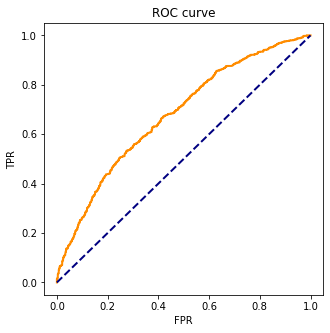

In [36]:
roc_auc_score(valid_y, log_reg.predict_proba(valid_X_pca200)[:,1])

fpr, tpr, _ = roc_curve(valid_y, log_prob[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [37]:
# Confusion matrices for multiple predictors logistic model. 

# Identify and display confusion matrix for training partition. 
print('Training Partition')
classificationSummary(train_y, log_reg.predict(train_X_pca200))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition')
classificationSummary(valid_y, log_reg.predict(valid_X_pca200))
print(classification_report(valid_y, log_reg.predict(valid_X_pca200)))

Training Partition
Confusion Matrix (Accuracy 0.6965)

       Prediction
Actual    0    1
     0 1113  724
     1  529 1762

Validation Partition
Confusion Matrix (Accuracy 0.6203)

       Prediction
Actual   0   1
     0 424 393
     1 279 674
              precision    recall  f1-score   support

           0       0.60      0.52      0.56       817
           1       0.63      0.71      0.67       953

    accuracy                           0.62      1770
   macro avg       0.62      0.61      0.61      1770
weighted avg       0.62      0.62      0.62      1770



<AxesSubplot:>

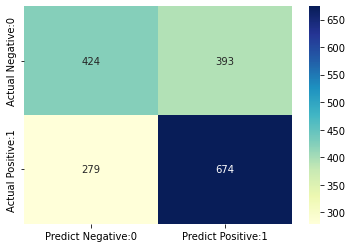

In [38]:
cm = confusion_matrix(valid_y, log_reg.predict(valid_X_pca200))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# KNN Classifier

In [39]:
# Apply NearestNeighbors() function for k=3 in training 
# parition. 
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(train_X_pca200, train_y)

KNeighborsClassifier(n_neighbors=3)

In [40]:
# Make EV intention classification for validation set 
# using EV intention KNN model. 

# Use knn model to classify EV intention
# for validation set.
EV_pred_knn = knn.predict(valid_X_pca200)

# Predict EV intention probabilities p(0), p(1),
# and p(2) for validation set.
EV_pred_prob_knn = np.round(knn.predict_proba(valid_X_pca200), 
                          decimals=4)

# Create data frame to display classification results for
# validation set. 
EV_pred_knn_result = pd.DataFrame({'Actual': valid_y, 
                'p(0)': [p[0] for p in EV_pred_prob_knn],
                'p(1)': [p[1] for p in EV_pred_prob_knn],
                'Classification': EV_pred_knn})

print('Classification for EV intention Data for Validation Partition')
print(EV_pred_knn_result.head(10))

Classification for EV intention Data for Validation Partition
      Actual    p(0)    p(1)  Classification
573        1  0.3333  0.6667               1
3219       1  0.3333  0.6667               1
4436       0  0.6667  0.3333               0
3887       1  0.6667  0.3333               0
3656       1  0.0000  1.0000               1
3680       1  0.6667  0.3333               0
1513       1  0.0000  1.0000               1
79         1  0.0000  1.0000               1
4072       1  1.0000  0.0000               0
3259       0  0.6667  0.3333               0


In [41]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, knn.predict_proba(valid_X_pca200)[:,1])

#print AUC score
print(auc)

0.6140160364551293


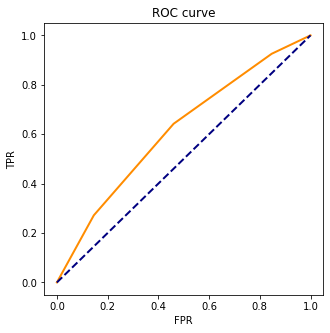

In [42]:
roc_auc_score(valid_y, knn.predict_proba(valid_X_pca200)[:,1])

fpr, tpr, _ = roc_curve(valid_y, EV_pred_prob_knn[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [43]:
# Confusion matrices for multiple predictors logistic model. 

# Identify and display confusion matrix for training partition. 
print('Training Partition')
classificationSummary(train_y, knn.predict(train_X_pca200))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition')
classificationSummary(valid_y, knn.predict(valid_X_pca200))
print(classification_report(valid_y, knn.predict(valid_X_pca200)))

Training Partition
Confusion Matrix (Accuracy 0.8203)

       Prediction
Actual    0    1
     0 1450  387
     1  355 1936

Validation Partition
Confusion Matrix (Accuracy 0.5949)

       Prediction
Actual   0   1
     0 441 376
     1 341 612
              precision    recall  f1-score   support

           0       0.56      0.54      0.55       817
           1       0.62      0.64      0.63       953

    accuracy                           0.59      1770
   macro avg       0.59      0.59      0.59      1770
weighted avg       0.59      0.59      0.59      1770



In [44]:
# Identify best k value for number of nearest neighbors using 
# validation partition.

# Develop k-NN classifier using training partition for various
# values of k and then identify accuracy score using validation
# partition. Accuracy score (accuracy) means a probability of 
# correct predictions with the k-NN classifier. 
results = []
for k in range(1, 15):
    # Train knn classifier using training partition.
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X_pca200, train_y)
    results.append({
        'k': k,
        # For each k, identify accuracy score using validation 
        # partition.
        'Accuracy Score': accuracy_score(valid_y, knn.predict(valid_X_pca200))
    })

# Convert results to a pandas data frame. The smallest k value 
# with the highest accuracy is the best k to apply in k-NN 
# classifier. 
results = pd.DataFrame(results)
print(results)

     k  Accuracy Score
0    1        0.621469
1    2        0.576271
2    3        0.594915
3    4        0.576836
4    5        0.581921
5    6        0.568362
6    7        0.588701
7    8        0.575706
8    9        0.593220
9   10        0.581356
10  11        0.583616
11  12        0.569492
12  13        0.574576
13  14        0.576271


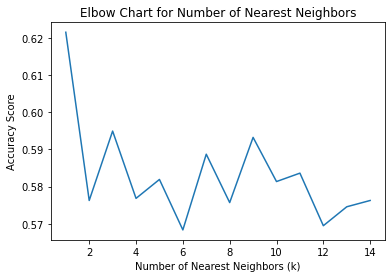

In [45]:
# Develop and display Elbow chart to compare accuracy_score with 
# number of nearest neighbors, k, from 1 to 20. 
ax = results.plot(x='k', y='Accuracy Score')
plt.xlabel('Number of Nearest Neighbors (k)')
plt.ylabel('Accuracy Score')

plt.title('Elbow Chart for Number of Nearest Neighbors')
ax.legend().set_visible(False)
plt.show()

## <font color= "Orange">Different Classification Tree Models:
<ol>
  <font color= "Blue"><li>Full Classification tree</li>
      <li>Smaller Classification tree using random controlled parameters</li>
      <li>Smaller Classification tree using Grid Search results</li>
</ol>

In [46]:
# Grow full classification tree using training partition.
fullClassTree = DecisionTreeClassifier()
fullClassTree.fit(train_X_pca200, train_y)

# Using plotDecisionTree() to visualize the full tree.
plotDecisionTree(fullClassTree, feature_names=train_X_pca200.columns)

In [47]:
# Indetify and display number of nodes in the tree.
tree_nodes = fullClassTree.tree_.node_count
print('Number of nodes:', tree_nodes)

Number of nodes: 1001


In [48]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, fullClassTree.predict_proba(valid_X_pca200)[:,1])

#print AUC score
print(auc)

0.6573437485952369


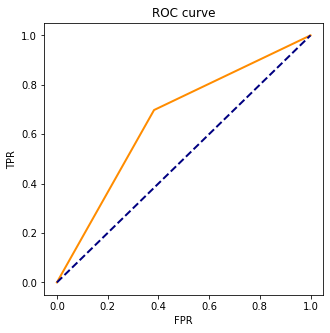

In [49]:
roc_auc_score(valid_y, fullClassTree.predict_proba(valid_X_pca200)[:,1])

fpr, tpr, _ = roc_curve(valid_y, fullClassTree.predict_proba(valid_X_pca200)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [50]:
# Confusion matrices for full classification tree. 

# Identify  and display confusion matrix for training partition. 
print('Training Partition')
classificationSummary(train_y, fullClassTree.predict(train_X_pca200))

# Identify  and display confusion matrix for validation partition. 
print()
print('Validation Partition')
classificationSummary(valid_y, fullClassTree.predict(valid_X_pca200))
print(classification_report(valid_y, fullClassTree.predict(valid_X_pca200)))

#its a measure for classifictaion measurement
#o means non acceptance and 1 means accept
#287 predicted one and 2713 non accepr
#in valid,98% predicted correctly.1794 predicted correctly and 
#13 predicted incorrrectly(non accepted 13 predicted as accepted)
#166 predicted correctly and 27 predicted incorrectly
#down diagonal correct preedicton and other diagonal is incorrect

# accuracy=1794+166/2000=0.98
# misclassification(error)=27+13/2000=1-accuracy=0.02= 2%
#give idea of how many records are predicted coreect and incorrect in matrix

Training Partition
Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual    0    1
     0 1837    0
     1    0 2291

Validation Partition
Confusion Matrix (Accuracy 0.6605)

       Prediction
Actual   0   1
     0 504 313
     1 288 665
              precision    recall  f1-score   support

           0       0.64      0.62      0.63       817
           1       0.68      0.70      0.69       953

    accuracy                           0.66      1770
   macro avg       0.66      0.66      0.66      1770
weighted avg       0.66      0.66      0.66      1770



<AxesSubplot:>

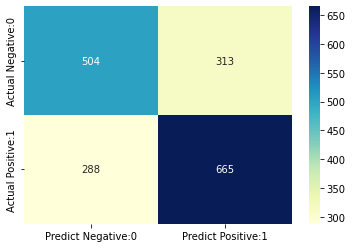

In [51]:
cm = confusion_matrix(valid_y, fullClassTree.predict(valid_X_pca200))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Smaller classification tree using DecisionTreeClassifier() control parameters

Small Classification Tree with Control Parameters


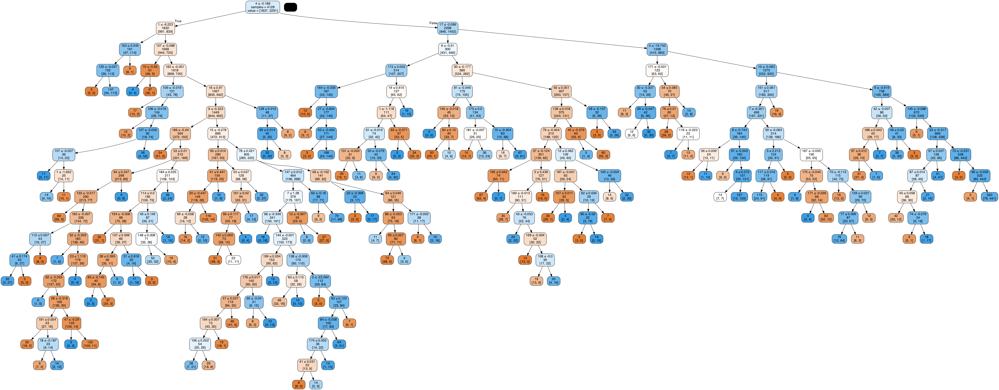

In [52]:
# Create a smaller classification tree for training partition
# using DecisionTreeClassifier() function control parameters:
#  - Maximum Tree depth (number of splits) = 20;
#  - Minimum impurity decrease per split = 0 
#  - Minimum number of sample records in a node for splitting = 30.   
smallClassTree = DecisionTreeClassifier(max_depth=30, 
        min_impurity_decrease=0.001, min_samples_split=20)
smallClassTree.fit(train_X_pca200, train_y)

# Display classification tree for training partition.
print('Small Classification Tree with Control Parameters')
plotDecisionTree(smallClassTree, feature_names=train_X_pca200.columns)

In [53]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, smallClassTree.predict_proba(valid_X_pca200)[:,1])

#print AUC score
print(auc)

0.6518068946739087


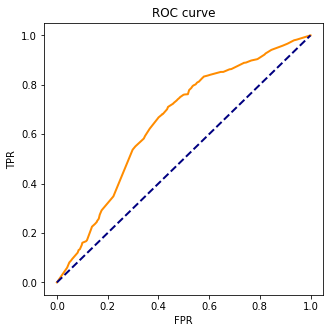

In [54]:
roc_auc_score(valid_y, smallClassTree.predict_proba(valid_X_pca200)[:,1])

fpr, tpr, _ = roc_curve(valid_y, smallClassTree.predict_proba(valid_X_pca200)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [55]:
# Confusion matrices for smaller classification tree. 

# Identify  and display confusion matrix for training partition. 
print('Training Partition for Smaller Tree with control parameters')
classificationSummary(train_y, smallClassTree.predict(train_X_pca200))

# Identify  and display confusion matrix for validation partition. 
print()
print('Validation Partition for Smaller Tree with control parameters')
classificationSummary(valid_y, smallClassTree.predict(valid_X_pca200))
print(classification_report(valid_y, smallClassTree.predict(valid_X_pca200)))


Training Partition for Smaller Tree with control parameters
Confusion Matrix (Accuracy 0.8636)

       Prediction
Actual    0    1
     0 1501  336
     1  227 2064

Validation Partition for Smaller Tree with control parameters
Confusion Matrix (Accuracy 0.6401)

       Prediction
Actual   0   1
     0 441 376
     1 261 692
              precision    recall  f1-score   support

           0       0.63      0.54      0.58       817
           1       0.65      0.73      0.68       953

    accuracy                           0.64      1770
   macro avg       0.64      0.63      0.63      1770
weighted avg       0.64      0.64      0.64      1770



<AxesSubplot:>

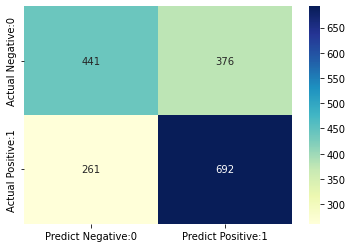

In [56]:
cm = confusion_matrix(valid_y, smallClassTree.predict(valid_X_pca200))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Smaller Classification tree using Grid Search results

In [57]:
# Improve grid search parameters by adapting grid based 
# on results from initial grid search parameters.
param_grid = {
    'max_depth': list(range(10, 30)),  
    'min_impurity_decrease': [0.0005, 0.001], 
    'min_samples_split': list(range(10, 30)),
}

# Apply GridSearchCV() fucntion for various combinations of
# DecisionTreeClassifier() improved parameters. 
gridSearch = GridSearchCV(DecisionTreeClassifier(), 
                param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X_pca200, train_y)

# Display best improved paramenters of classification tree. 
print()
print(f'Improved score:{gridSearch.best_score_:.4f}')
print('Improved parameters: ', gridSearch.best_params_)


Improved score:0.6449
Improved parameters:  {'max_depth': 14, 'min_impurity_decrease': 0.0005, 'min_samples_split': 13}


Best Classification Tree with Grid Search


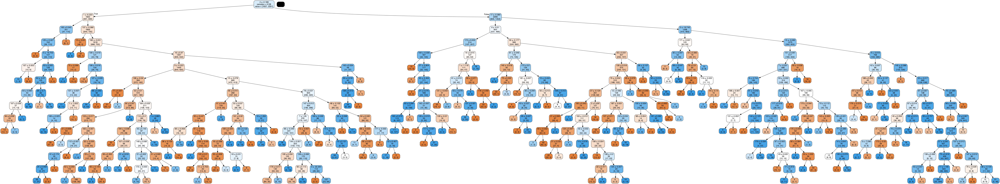

In [58]:
# Create classification tree based on the improved parameters.
bestClassTree = gridSearch.best_estimator_

# Display classification tree based on improved parameters
print('Best Classification Tree with Grid Search')
plotDecisionTree(bestClassTree, feature_names=train_X_pca200.columns)

In [59]:
# Identify and display number of nodes in the tree
# based on grid search.
tree_nodes_grid = bestClassTree.tree_.node_count
print('Number of nodes:', tree_nodes_grid)

Number of nodes: 461


In [60]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, gridSearch.predict_proba(valid_X_pca200)[:,1])

#print AUC score
print(auc)

0.6493210257885618


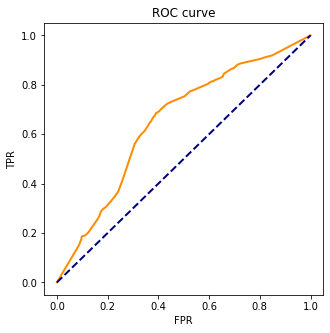

In [61]:
roc_auc_score(valid_y, gridSearch.predict_proba(valid_X_pca200)[:,1])

fpr, tpr, _ = roc_curve(valid_y, gridSearch.predict_proba(valid_X_pca200)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [62]:
# Confusion matrices for grid search classification tree. 

# Identify and display confusion matrix for training partition. 
print('Training Partition for classification tree based on grid search')
classificationSummary(train_y, bestClassTree.predict(train_X_pca200))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition for classification tree based on grid search')
classificationSummary(valid_y, bestClassTree.predict(valid_X_pca200))
print(classification_report(valid_y, bestClassTree.predict(valid_X_pca200)))

Training Partition for classification tree based on grid search
Confusion Matrix (Accuracy 0.9055)

       Prediction
Actual    0    1
     0 1661  176
     1  214 2077

Validation Partition for classification tree based on grid search
Confusion Matrix (Accuracy 0.6492)

       Prediction
Actual   0   1
     0 494 323
     1 298 655
              precision    recall  f1-score   support

           0       0.62      0.60      0.61       817
           1       0.67      0.69      0.68       953

    accuracy                           0.65      1770
   macro avg       0.65      0.65      0.65      1770
weighted avg       0.65      0.65      0.65      1770



<AxesSubplot:>

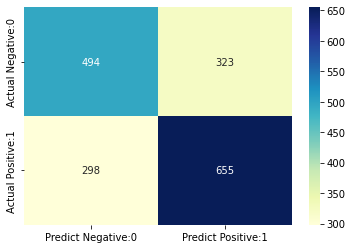

In [63]:
cm = confusion_matrix(valid_y, bestClassTree.predict(valid_X_pca200))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Random Forest trees

In [64]:
# Apply RandomForestClassifier() function to develop a combined
# (ensemble) classification tree using Random Forest algorithm.
rf = RandomForestClassifier(n_estimators=1000, random_state=1)
rf.fit(train_X_pca200, train_y)

# Display number of nodes in Random Forest trees.
n_nodes = rf.estimators_[0].tree_.node_count
print('Number of Nodes in Tree in Random Forest:', n_nodes)

Number of Nodes in Tree in Random Forest: 987


In [65]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, rf.predict_proba(valid_X_pca200)[:,1])

#print AUC score
print(auc)

0.8419171051668313


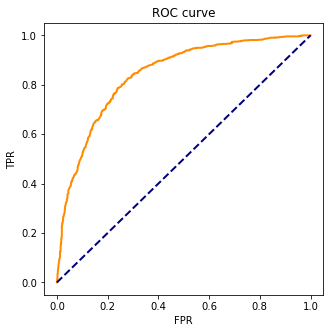

In [66]:
roc_auc_score(valid_y, rf.predict_proba(valid_X_pca200)[:,1])

fpr, tpr, _ = roc_curve(valid_y, rf.predict_proba(valid_X_pca200)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [67]:
# Confusion matrices for Random Forest classification. 

# Identify  and display confusion matrix for training partition. 
print('Training Partition for Random Forest Tree')
classificationSummary(train_y, rf.predict(train_X_pca200))

# Identify  and display confusion matrix for validation partition. 
print()
print('Validation Partition for Random Forest Tree')
classificationSummary(valid_y, rf.predict(valid_X_pca200))
print(classification_report(valid_y, rf.predict(valid_X_pca200)))


Training Partition for Random Forest Tree
Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual    0    1
     0 1837    0
     1    0 2291

Validation Partition for Random Forest Tree
Confusion Matrix (Accuracy 0.7706)

       Prediction
Actual   0   1
     0 555 262
     1 144 809
              precision    recall  f1-score   support

           0       0.79      0.68      0.73       817
           1       0.76      0.85      0.80       953

    accuracy                           0.77      1770
   macro avg       0.77      0.76      0.77      1770
weighted avg       0.77      0.77      0.77      1770



<AxesSubplot:title={'center':'Confusion Matrix'}>

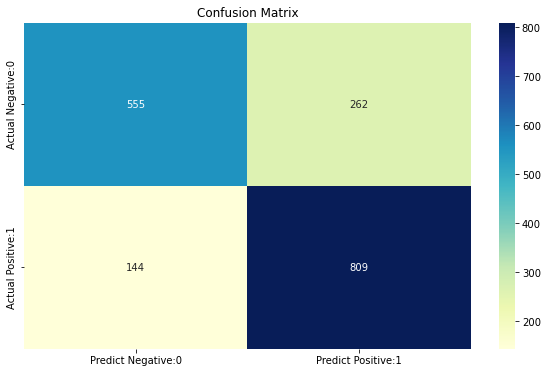

In [68]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_title('Confusion Matrix')
cm = confusion_matrix(valid_y, rf.predict(valid_X_pca200))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [69]:
# For Random Forest, identify variable importance scores. 
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

# Develop data frame for variable importance. The table data is sorted
# in descending order (ascending=False).
score_df = pd.DataFrame({'Feature': train_X_pca200.columns, 'Importance': importances, 'Std': std})
score_df = score_df.sort_values('Importance', ascending=False)

# Display variable importance for Random Forest results. 
print('Variable Importance Scores for Random Forest')
print(score_df)

Variable Importance Scores for Random Forest
     Feature  Importance       Std
4          4    0.021302  0.011298
17        17    0.012094  0.007793
6          6    0.011500  0.007972
1          1    0.011040  0.006895
15        15    0.010849  0.007270
..       ...         ...       ...
177      177    0.004066  0.003401
128      128    0.004049  0.003519
169      169    0.004043  0.003416
155      155    0.003984  0.003705
118      118    0.003981  0.003436

[200 rows x 3 columns]


<Figure size 7200x360000 with 0 Axes>

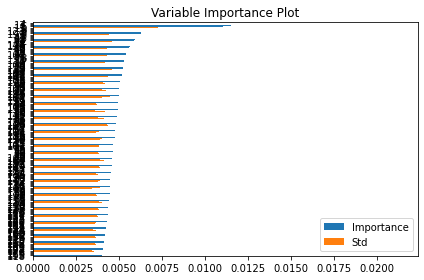

In [70]:
# Develop variable importance plot.
score_df = score_df.sort_values('Importance')
plt.figure(figsize=(100,5000))
ax = score_df.plot(kind='barh', x='Feature')
ax.set_ylabel('')
plt.title('Variable Importance Plot')
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

## Boosted Tree

In [71]:
# Apply GradientBoostingClassifier() function to develop a combined
# boosted tree.  
boost = GradientBoostingClassifier(learning_rate=0.05, n_estimators=500, random_state=1,
                           subsample=0.7)
boost.fit(train_X_pca200, train_y)

GradientBoostingClassifier(learning_rate=0.05, n_estimators=500, random_state=1,
                           subsample=0.7)

In [72]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, boost.predict_proba(valid_X_pca200)[:,1])

#print AUC score
print(auc)

0.8113847785964825


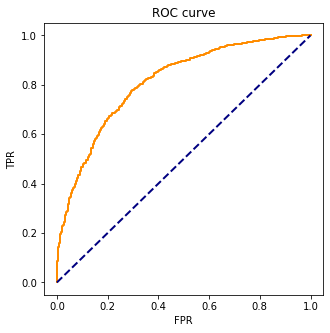

In [73]:
roc_auc_score(valid_y, boost.predict_proba(valid_X_pca200)[:,1])

fpr, tpr, _ = roc_curve(valid_y, boost.predict_proba(valid_X_pca200)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [74]:
# Confusion matrices for Boosted Tree classification. 

# Identify  and show confusion matrix for training partition. 
print('Training Partition for Boosted Tree')
classificationSummary(train_y, boost.predict(train_X_pca200))

# Identify  and show confusion matrix for validation partition. 
print()
print('Validation Partition for Boosted Tree')
classificationSummary(valid_y, boost.predict(valid_X_pca200))
print(classification_report(valid_y, boost.predict(valid_X_pca200)))

Training Partition for Boosted Tree
Confusion Matrix (Accuracy 0.9249)

       Prediction
Actual    0    1
     0 1626  211
     1   99 2192

Validation Partition for Boosted Tree
Confusion Matrix (Accuracy 0.7395)

       Prediction
Actual   0   1
     0 542 275
     1 186 767
              precision    recall  f1-score   support

           0       0.74      0.66      0.70       817
           1       0.74      0.80      0.77       953

    accuracy                           0.74      1770
   macro avg       0.74      0.73      0.74      1770
weighted avg       0.74      0.74      0.74      1770



<AxesSubplot:>

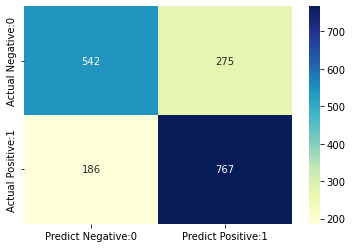

In [75]:
cm = confusion_matrix(valid_y, boost.predict(valid_X_pca200))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# xgboost

In [76]:
xgbc = XGBClassifier(random_state=1,
                n_estimators=500,                
                learning_rate=0.05,      
                subsample=0.7,booster='gbtree')
#print(xgbc)
#XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
#       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
#       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
#       n_estimators=100, n_jobs=1, nthread=None,
#       objective='multi:softprob', random_state=0, reg_alpha=0,
#      reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
#      subsample=1, verbosity=1)
xgbc.fit(train_X_pca200, train_y)

[10:18:43] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.05, max_delta_step=0,
              max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=500, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.7,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [77]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, xgbc.predict_proba(valid_X_pca200)[:,1])

#print AUC score
print(auc)

0.8462485920259544


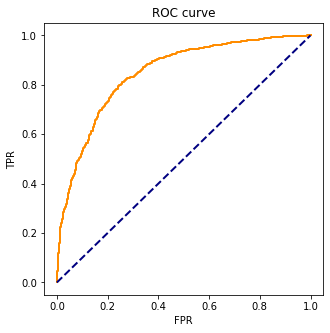

In [78]:
roc_auc_score(valid_y, xgbc.predict_proba(valid_X_pca200)[:,1])

fpr, tpr, _ = roc_curve(valid_y, xgbc.predict_proba(valid_X_pca200)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [79]:
# Confusion matrices for XGBoosted Tree classification. 

# Identify  and show confusion matrix for training partition. 
print('Training Partition for XGBoosted Tree')
classificationSummary(train_y, xgbc.predict(train_X_pca200))

# Identify  and show confusion matrix for validation partition. 
print()
print('Validation Partition for XGBoosted Tree')
classificationSummary(valid_y, xgbc.predict(valid_X_pca200))
print(classification_report(valid_y, xgbc.predict(valid_X_pca200)))

Training Partition for XGBoosted Tree
Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual    0    1
     0 1837    0
     1    0 2291

Validation Partition for XGBoosted Tree
Confusion Matrix (Accuracy 0.7740)

       Prediction
Actual   0   1
     0 580 237
     1 163 790
              precision    recall  f1-score   support

           0       0.78      0.71      0.74       817
           1       0.77      0.83      0.80       953

    accuracy                           0.77      1770
   macro avg       0.77      0.77      0.77      1770
weighted avg       0.77      0.77      0.77      1770



<AxesSubplot:>

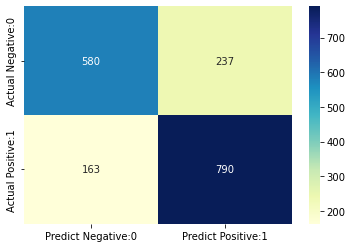

In [80]:
cm = confusion_matrix(valid_y, xgbc.predict(valid_X_pca200))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# LightGBM

In [81]:
lgbmc = LGBMClassifier(random_state=1,
                n_estimators=500,                
                learning_rate=0.05,      
                subsample=0.7)
lgbmc.fit(train_X_pca200, train_y)


LGBMClassifier(learning_rate=0.05, n_estimators=500, random_state=1,
               subsample=0.7)

In [82]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, lgbmc.predict_proba(valid_X_pca200)[:,1])

#print AUC score
print(auc)

0.8358414643700689


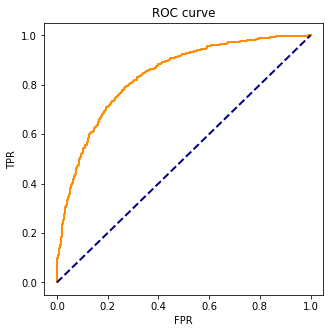

In [83]:
roc_auc_score(valid_y, lgbmc.predict_proba(valid_X_pca200)[:,1])

fpr, tpr, _ = roc_curve(valid_y, lgbmc.predict_proba(valid_X_pca200)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [84]:
classificationSummary(train_y, lgbmc.predict(train_X_pca200))

classificationSummary(valid_y, lgbmc.predict(valid_X_pca200))
print(classification_report(valid_y, lgbmc.predict(valid_X_pca200)))

Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual    0    1
     0 1837    0
     1    0 2291
Confusion Matrix (Accuracy 0.7599)

       Prediction
Actual   0   1
     0 563 254
     1 171 782
              precision    recall  f1-score   support

           0       0.77      0.69      0.73       817
           1       0.75      0.82      0.79       953

    accuracy                           0.76      1770
   macro avg       0.76      0.75      0.76      1770
weighted avg       0.76      0.76      0.76      1770



<AxesSubplot:>

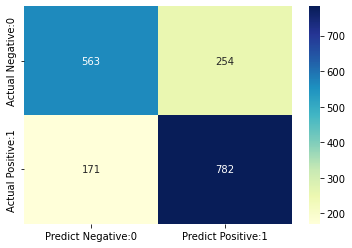

In [85]:
cm = confusion_matrix(valid_y, lgbmc.predict(valid_X_pca200))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Neural Network Model

## <font color= "Orange">Different Neural Network Models:
<ol>
  <font color= "Blue"><li>Neural Network Model using multiple Predictors</li>
      <li>Neural Network Model Based on Grid Search</li>
</ol>

## Neural network Model 

In [86]:
# Create outcome and predictors to run neural network
# model.
#outcome = 'bichoice'
#drop = ['bichoice','highway','town','state','home_park']
#predictors = [c for c in EV_intention_df.columns if c != drop]


# Create predictors and outcome variables.  
#X = EV_intention_df.drop(columns=['bichoice','state','zipcode'])
#y = EV_intention_df['bichoice']

# Partition data into training (60% or 0.6) and validation(40% or 0.4)
# of the EV_intention_df data frame.
#train_X, valid_X, train_y, valid_y = train_test_split(X, y, 
#                            test_size=0.2, random_state=1)

# Use MLPCclassifier() function to train neural network model.
# Apply: 
# (a) default input layer with the number of nodes equal 
#     to number of predictor variables (20); 
# (b) single hidden layer with 3 nodes (default is 2); 
# (c) default output layer with the number nodes equal
#     to number of classes in outcome variable (2);
# (d) 'logistic' activation function;
# (e) solver = 'lbfgs', which is applied for small data 
#     sets for better performance and fast convergence. 
#     For large data sets, apply default solver = 'adam'. 
EV_intention_clf = MLPClassifier(hidden_layer_sizes=(3), max_iter=10000,activation='logistic',
                    solver='lbfgs', random_state=1)
EV_intention_clf.fit(train_X_pca200, train_y)

# Display network structure with the final values of 
# intercepts (Theta) and weights (W).
print('Final Intercepts for EV intention Neural Network Model')
print(EV_intention_clf.intercepts_)

print()
print('Network Weights for EV intention Neural Network Model')
print(EV_intention_clf.coefs_)

Final Intercepts for EV intention Neural Network Model
[array([-15.03927875,   7.45803969,   2.22937565]), array([2.55353508])]

Network Weights for EV intention Neural Network Model
[array([[ 8.23577624e-01,  7.89062809e-02,  1.53739171e+00],
       [ 6.11048127e-01, -4.00533072e-01, -3.56675978e+00],
       [ 6.92625390e+00, -8.53363867e-01,  5.03474846e-01],
       [ 4.60068594e+00,  1.38590257e+00,  1.05259116e+01],
       [ 8.94961248e+00, -4.84059624e+00,  1.46312826e+01],
       [ 9.18520650e+00, -2.11918496e+00, -9.57019158e+00],
       [ 5.10318636e+00,  2.88378480e+00, -8.66290397e+00],
       [ 9.72302244e+00, -2.88570354e+00, -1.21863282e+01],
       [-4.47974830e+00,  5.99791853e+00,  1.57739337e+01],
       [-6.04852269e+00, -5.74069184e+00, -3.39583284e+00],
       [ 1.61042353e+01, -2.97435022e+00, -1.64431938e+01],
       [ 1.34297951e+01, -2.26200287e+00,  3.02183431e+00],
       [-1.56917744e+01,  5.42422434e+00,  1.52363889e+01],
       [ 2.73260846e+01, -5.28565488

In [87]:
# Make Ev intention classification for validation set 
# using EV intention neural network model. 

# Use EV_intention_clf model to classify EV intention
# for validation set.
EV_Intention_pred = EV_intention_clf.predict(valid_X_pca200)

# Predict target probabilities p(0), p(1),
# and p(2) for validation set.
EV_pred_prob = np.round(EV_intention_clf.predict_proba(valid_X_pca200), 
                          decimals=4)

# Create data frame to display classification results for
# validation set. 
EV_pred_result = pd.DataFrame({'Actual': valid_y, 
                'p(0)': [p[0] for p in EV_pred_prob],
                'p(1)': [p[1] for p in EV_pred_prob],
                'Classification': EV_Intention_pred})

print('Classification for EV intention data for Validation Partition')
print(EV_pred_result.head(10))

Classification for EV intention data for Validation Partition
      Actual    p(0)    p(1)  Classification
573        1  0.1723  0.8277               1
3219       1  0.7897  0.2103               0
4436       0  0.5868  0.4132               0
3887       1  0.0730  0.9270               1
3656       1  0.1723  0.8277               1
3680       1  0.1723  0.8277               1
1513       1  0.1723  0.8277               1
79         1  0.0919  0.9081               1
4072       1  0.7570  0.2430               0
3259       0  0.1723  0.8277               1


In [88]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, EV_intention_clf.predict_proba(valid_X_pca200)[:,1])

#print AUC score
print(auc)

0.6485510550333226


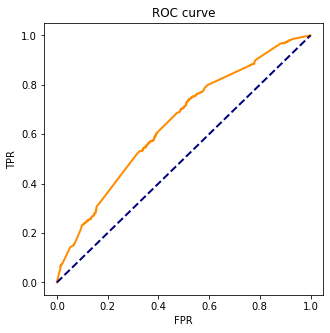

In [89]:
roc_auc_score(valid_y, EV_intention_clf.predict_proba(valid_X_pca200)[:,1])

fpr, tpr, _ = roc_curve(valid_y, EV_pred_prob[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [90]:
# Confusion matrices for EV intention neural network model. 

# Identify and display confusion matrix for training partition. 
print('Training Partition for Neural Network Model')
classificationSummary(train_y, EV_intention_clf.predict(train_X_pca200))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition for Neural Network Model')
classificationSummary(valid_y, EV_intention_clf.predict(valid_X_pca200))
print(classification_report(valid_y, EV_intention_clf.predict(valid_X_pca200)))

Training Partition for Neural Network Model
Confusion Matrix (Accuracy 0.8307)

       Prediction
Actual    0    1
     0 1599  238
     1  461 1830

Validation Partition for Neural Network Model
Confusion Matrix (Accuracy 0.5960)

       Prediction
Actual   0   1
     0 506 311
     1 404 549
              precision    recall  f1-score   support

           0       0.56      0.62      0.59       817
           1       0.64      0.58      0.61       953

    accuracy                           0.60      1770
   macro avg       0.60      0.60      0.60      1770
weighted avg       0.60      0.60      0.60      1770



<AxesSubplot:>

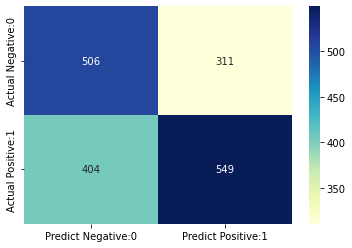

In [91]:
cm = confusion_matrix(valid_y, EV_intention_clf.predict(valid_X_pca200))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Neural network Model using Grid Search

In [92]:
# Identify grid search parameters. 
param_grid = {
    'hidden_layer_sizes': list(range(2, 20)), 
}

# Utilize GridSearchCV() to identify the best number 
# of nodes in the hidden layer. 
gridSearch = GridSearchCV(MLPClassifier(solver='lbfgs', max_iter=10000, random_state=1), 
                          param_grid, cv=5, n_jobs=-1, return_train_score=True)
gridSearch.fit(train_X_pca200, train_y)

# Display the best score and best parament value.
print(f'Best score:{gridSearch.best_score_:.4f}')
print('Best parameter: ', gridSearch.best_params_)

Best score:0.6931
Best parameter:  {'hidden_layer_sizes': 5}


In [93]:
# Use MLPCclassifier() function to train the improved neural network model
# based on grid search results. 

# Apply: 
# (a) default input layer with the number of nodes equal 
#     to number of predictor variables (20); 
# (b) single hidden layer with 10 nodes based on grid search; 
# (c) default output layer with the number nodes equal
#     to number of classes in outcome variable (2);
# (d) 'logistic' activation function;
# (e) solver = 'lbfgs', which is applied for small data 
#     sets for better performance and fast convergence. 
#     For large data sets, apply default solver = 'adam'. 
EV_clf_imp = MLPClassifier(hidden_layer_sizes=(5), max_iter=10000,
                activation='logistic', solver='lbfgs', random_state=1)
EV_clf_imp.fit(train_X_pca200, train_y)

# Display network structure with the final values of 
# intercepts (Theta) and weights (W).
print('Final Intercepts for EV intention Neural Network Model based on grid search')
print(EV_clf_imp.intercepts_)

print()
print('Network Weights for EV intention Neural Network Model based on grid search')
print(EV_clf_imp.coefs_)

Final Intercepts for EV intention Neural Network Model based on grid search
[array([-1.34175541,  9.71960299,  2.52544574,  3.77859952, -7.93678073]), array([3.57613744])]

Network Weights for EV intention Neural Network Model based on grid search
[array([[-4.88142806e+00, -3.63703951e+00,  3.37377191e+00,
         2.63727875e-01, -4.67939000e-01],
       [-1.64072732e+00,  1.65664241e+01, -9.19841608e-01,
         9.40113848e+00,  1.97572365e-01],
       [-1.68718498e-01, -6.86986568e+00,  9.94418622e+00,
        -2.53809688e+00,  1.74609993e-01],
       [-1.73771060e+00,  5.11744960e+00, -3.51257113e+00,
        -2.26067246e+01, -3.83426472e+00],
       [-1.56174094e+01, -2.47782576e+01,  6.83334841e+00,
        -3.61260991e+01, -5.98300223e-01],
       [ 8.81668198e-01, -2.20340871e+00,  8.70879499e-01,
         3.20205160e+00, -1.66459642e+00],
       [-2.41191378e+01, -1.27874771e+01,  1.32147648e+01,
         5.50935178e+00, -1.00287498e+01],
       [ 1.39202625e+00,  1.17469678e

In [94]:
# Make EV intention classification for validation set 
# using EV intention neural network model. 

# Use EV_clf_imp model to classify EV intention
# for validation set.
EV_pred_imp = EV_clf_imp.predict(valid_X_pca200)

# Predict EV intention probabilities p(0), p(1),
# and p(2) for validation set.
EV_pred_prob_imp = np.round(EV_clf_imp.predict_proba(valid_X_pca200), 
                          decimals=4)

# Create data frame to display classification results for
# validation set. 
EV_pred_imp_result = pd.DataFrame({'Actual': valid_y, 
                'p(0)': [p[0] for p in EV_pred_prob_imp],
                'p(1)': [p[1] for p in EV_pred_prob_imp],
                'Classification': EV_pred_imp})

print('Classification for EV intention Data for Validation Partition')
print(EV_pred_imp_result.head(10))

Classification for EV intention Data for Validation Partition
      Actual    p(0)    p(1)  Classification
573        1  0.0272  0.9728               1
3219       1  0.0193  0.9807               1
4436       0  0.2784  0.7216               1
3887       1  0.8418  0.1582               0
3656       1  0.2786  0.7214               1
3680       1  0.7039  0.2961               0
1513       1  0.0590  0.9410               1
79         1  0.2785  0.7215               1
4072       1  0.7039  0.2961               0
3259       0  0.2786  0.7214               1


In [95]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, EV_clf_imp.predict_proba(valid_X_pca200)[:,1])

#print AUC score
print(auc)

0.6938907091051771


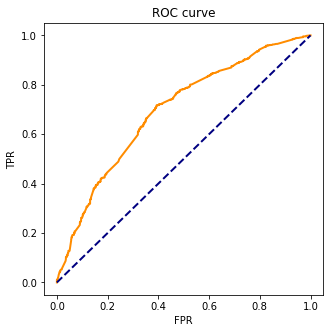

In [96]:
roc_auc_score(valid_y, EV_clf_imp.predict_proba(valid_X_pca200)[:,1])

fpr, tpr, _ = roc_curve(valid_y, EV_pred_prob_imp[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [97]:
# Confusion matrices for improved neural network model for EV intention
# using grid search results. 

# Identify and display confusion matrix for training partition. 
print('Training Partition for Neural Network Model based on grid search')
classificationSummary(train_y, EV_clf_imp.predict(train_X_pca200))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition for Neural Network Model based on grid search')
classificationSummary(valid_y, EV_clf_imp.predict(valid_X_pca200))
print(classification_report(valid_y, EV_clf_imp.predict(valid_X_pca200)))

Training Partition for Neural Network Model based on grid search
Confusion Matrix (Accuracy 0.8282)

       Prediction
Actual    0    1
     0 1366  471
     1  238 2053

Validation Partition for Neural Network Model based on grid search
Confusion Matrix (Accuracy 0.6514)

       Prediction
Actual   0   1
     0 448 369
     1 248 705
              precision    recall  f1-score   support

           0       0.64      0.55      0.59       817
           1       0.66      0.74      0.70       953

    accuracy                           0.65      1770
   macro avg       0.65      0.64      0.64      1770
weighted avg       0.65      0.65      0.65      1770



<AxesSubplot:>

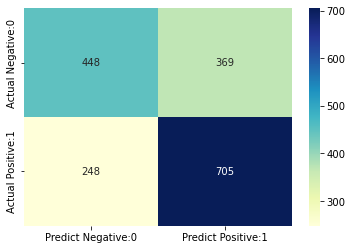

In [98]:
cm = confusion_matrix(valid_y, EV_clf_imp.predict(valid_X_pca200))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')